In [1]:
import glob

import cv2
import matplotlib.pyplot as plt
import numpy as np
from pidng.core import RPICAM2DNG
import rawpy
import tifffile as tiff

In [2]:
d = RPICAM2DNG()

In [3]:
directory = "lamptest_new_250_copy"
filepaths = glob.glob(f"{directory}/frame-*.jpg")
filepaths

['lamptest_new_250_copy/frame-00000.jpg',
 'lamptest_new_250_copy/frame-00001.jpg',
 'lamptest_new_250_copy/frame-00003.jpg',
 'lamptest_new_250_copy/frame-00002.jpg',
 'lamptest_new_250_copy/frame-00006.jpg',
 'lamptest_new_250_copy/frame-00007.jpg',
 'lamptest_new_250_copy/frame-00005.jpg',
 'lamptest_new_250_copy/frame-00004.jpg',
 'lamptest_new_250_copy/frame-00009.jpg',
 'lamptest_new_250_copy/frame-00008.jpg']

In [4]:
flatfieldpath = filepaths[0]
flatfieldpath

'lamptest_new_250_copy/frame-00000.jpg'

In [5]:
dngpath = d.convert(flatfieldpath)

In [6]:
raw = rawpy.imread(dngpath)
rgb = raw.postprocess(
    output_color=rawpy.ColorSpace.raw,
    gamma=(1, 1),
    user_wb=[1.0, 1.0, 1.0, 1.0],
    no_auto_bright=True,
    output_bps=16
)

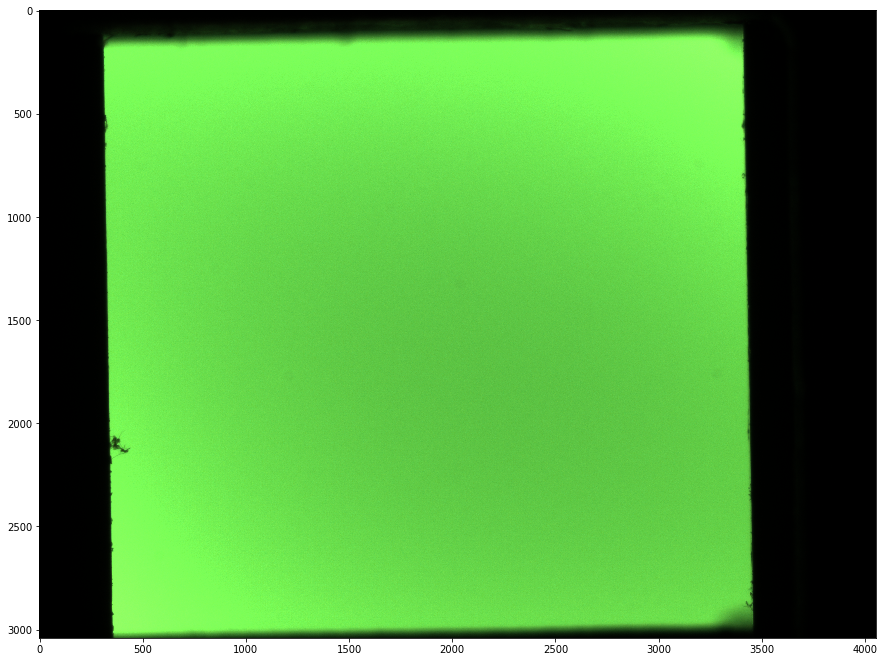

In [7]:
plt.figure(figsize=(15,12))
plt.imshow(rgb/(2**16), interpolation="none")
plt.show()

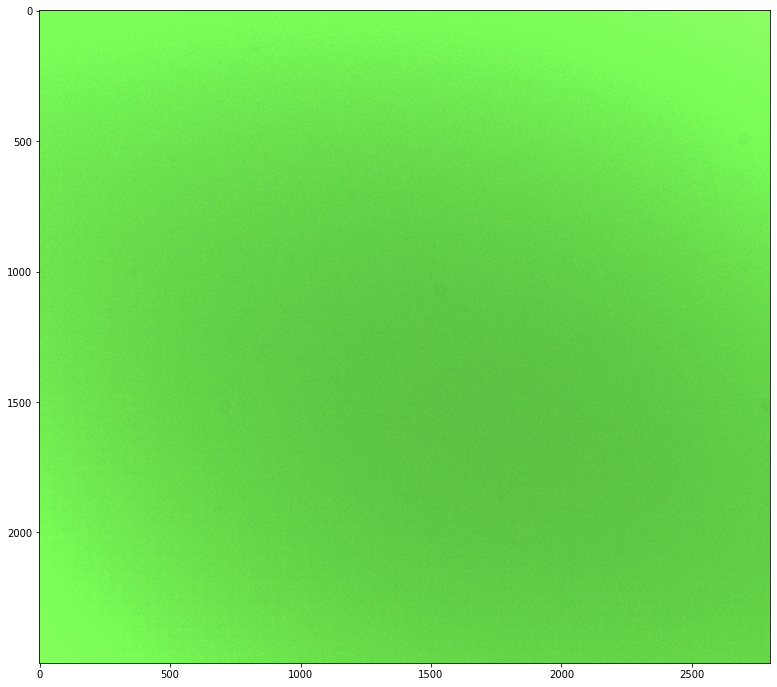

In [8]:
cropped = rgb[250:2750,500:3300]

plt.figure(figsize=(15,12))
plt.imshow(cropped/(2**16), interpolation="none")
plt.show()

In [9]:
avg_r = np.average(cropped[..., 0])
avg_g = np.average(cropped[..., 1])
avg_b = np.average(cropped[..., 2])
print(avg_r, avg_g, avg_b)

26886.37472742857 56405.244004142856 19519.355422285713


In [10]:
base_wb = [avg_g/avg_r, 1.0, avg_g/avg_b, 1.0]
print(base_wb)

[2.097911844790296, 1.0, 2.889708332260995, 1.0]


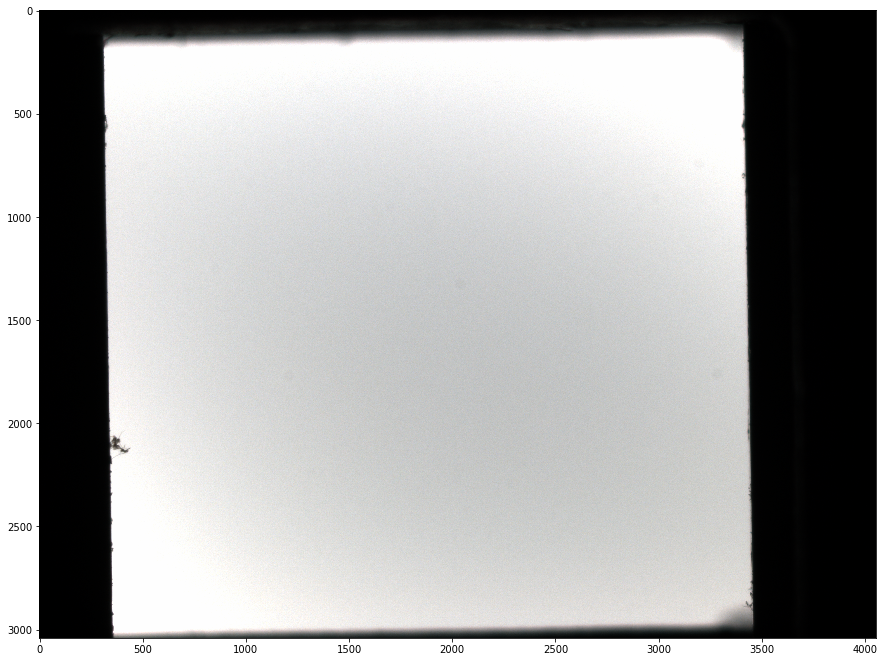

In [11]:
balanced = raw.postprocess(
    output_color=rawpy.ColorSpace.raw,
    gamma=(1, 1),
    user_wb=base_wb,
    no_auto_bright=True,
    output_bps=16
)

plt.figure(figsize=(15,12))
plt.imshow(balanced/(2**16), interpolation="none")
plt.show()

In [12]:
roi = balanced[250:2750,500:3300]
gain = roi.mean(axis=(0,1)) / balanced.astype("float").clip(1e-6, None)

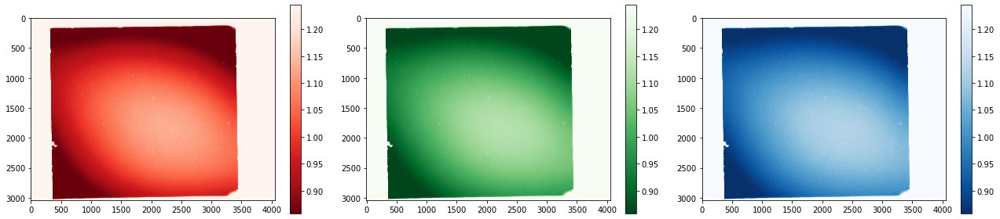

In [17]:
plt.figure(figsize=(18,4))
plt.subplot(131)
plt.imshow(gain[:,:,0], cmap="Reds_r", vmin=gain[250:2750,500:3300].min(), vmax=gain[250:2750,500:3300].max())
plt.colorbar()
plt.subplot(132)
plt.imshow(gain[:,:,1], cmap="Greens_r", vmin=gain[250:2750,500:3300].min(), vmax=gain[250:2750,500:3300].max())
plt.colorbar()
plt.subplot(133)
plt.imshow(gain[:,:,2], cmap="Blues_r", vmin=gain[250:2750,500:3300].min(), vmax=gain[250:2750,500:3300].max())
plt.colorbar()
plt.tight_layout()
plt.show()

In [18]:
directory = "lamptest_new_copy_copy"
filepaths = glob.glob(f"{directory}/frame-*.jpg")
filepaths

['lamptest_new_copy_copy/frame-00000.jpg',
 'lamptest_new_copy_copy/frame-00001.jpg',
 'lamptest_new_copy_copy/frame-00003.jpg',
 'lamptest_new_copy_copy/frame-00002.jpg',
 'lamptest_new_copy_copy/frame-00006.jpg',
 'lamptest_new_copy_copy/frame-00007.jpg',
 'lamptest_new_copy_copy/frame-00005.jpg',
 'lamptest_new_copy_copy/frame-00004.jpg',
 'lamptest_new_copy_copy/frame-00009.jpg',
 'lamptest_new_copy_copy/frame-00008.jpg']

In [19]:
examplepath = filepaths[3]
examplepath

'lamptest_new_copy_copy/frame-00002.jpg'

In [20]:
dngpath = d.convert(examplepath)

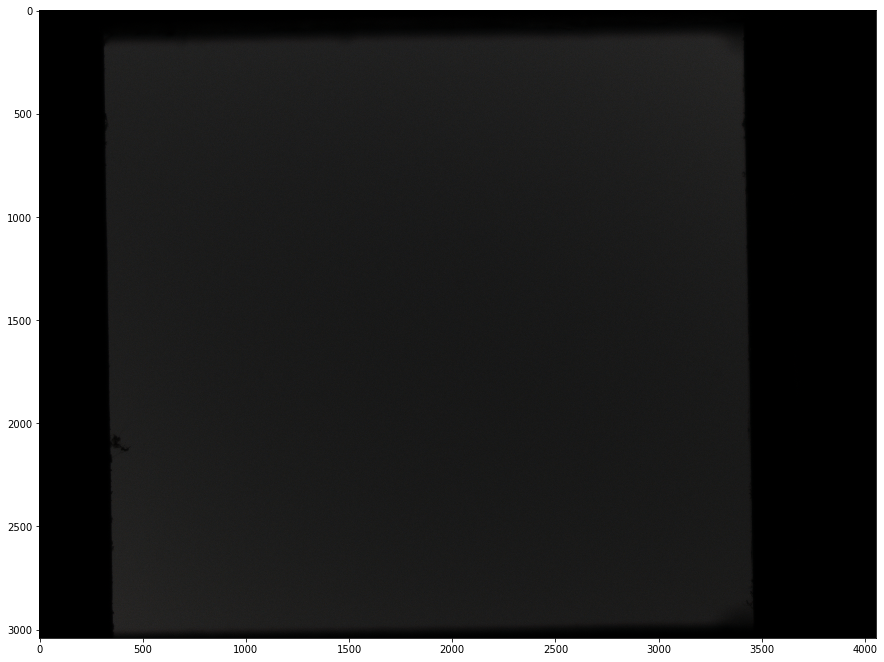

In [21]:
raw = rawpy.imread(dngpath)
rgb = raw.postprocess(
    output_color=rawpy.ColorSpace.raw,
    gamma=(1, 1),
    user_wb=base_wb,
    no_auto_bright=True,
    output_bps=16
)

plt.figure(figsize=(15,12))
plt.imshow(rgb/(2**16), interpolation="none")
plt.show()

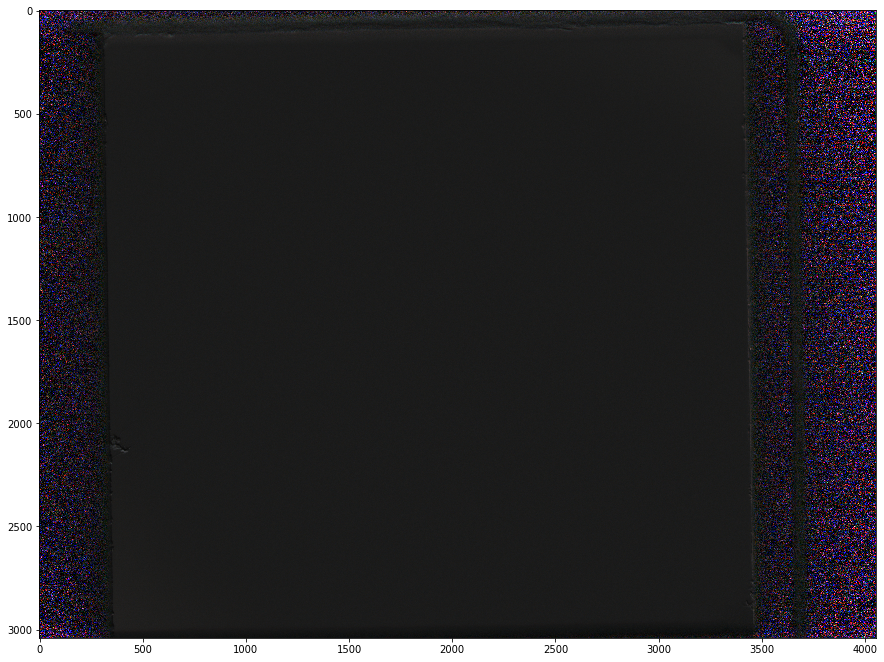

In [22]:
corrected = (rgb * gain).clip(0, 2**16-1).astype("uint16")

plt.figure(figsize=(15,12))
plt.imshow(corrected/(2**16), interpolation="none")
plt.show()

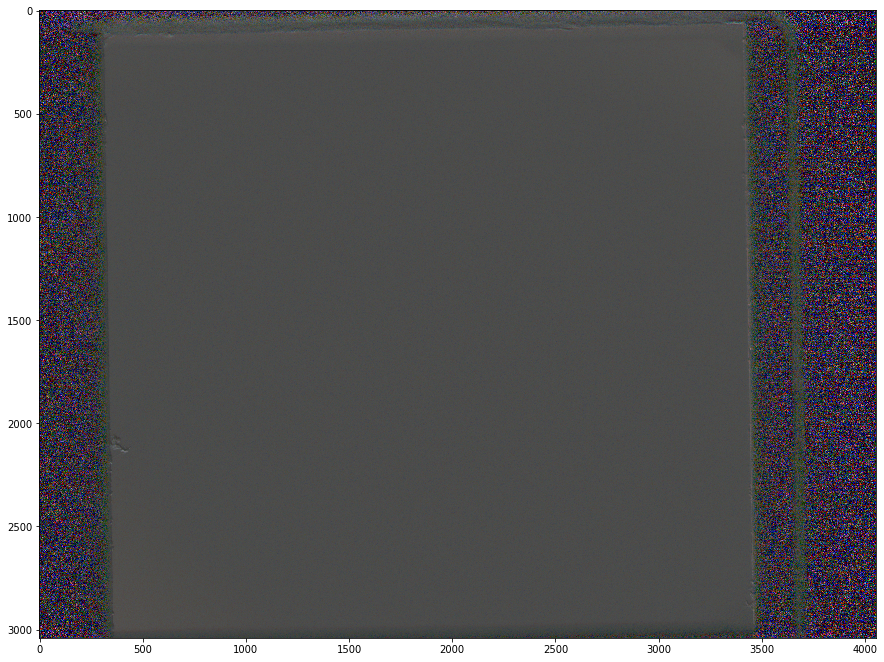

In [23]:
squashed = (corrected / 2**16 * 255).astype("uint8")
hsv = cv2.cvtColor(squashed, cv2.COLOR_RGB2HSV)
hsv[:,:,2] += 50
bright = cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)

plt.figure(figsize=(15,12))
plt.imshow(bright, interpolation="none")
plt.show()

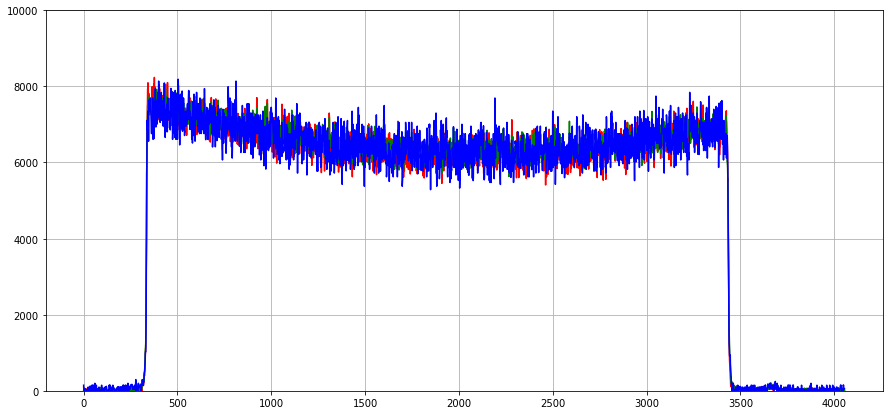

In [24]:
plt.figure(figsize=(15,7))
plt.plot(rgb[1500,:,0], c="r")
plt.plot(rgb[1500,:,1], c="g")
plt.plot(rgb[1500,:,2], c="b")
plt.ylim([0, 10000])
plt.grid()
plt.show()

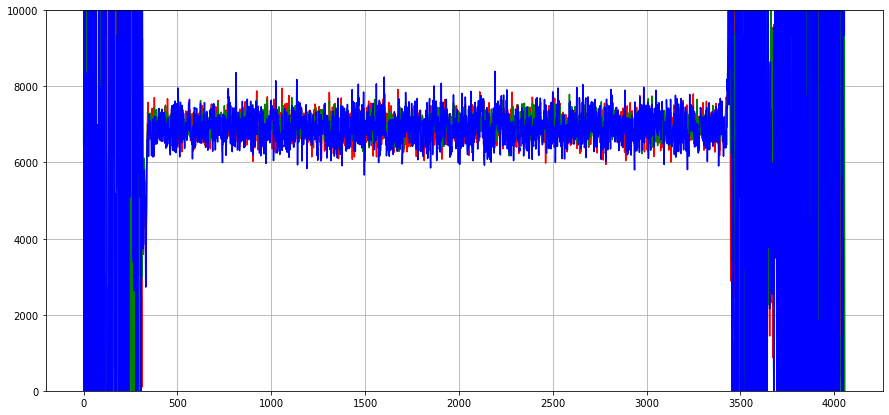

In [25]:
plt.figure(figsize=(15,7))
plt.plot(corrected[1500,:,0], c="r")
plt.plot(corrected[1500,:,1], c="g")
plt.plot(corrected[1500,:,2], c="b")
plt.ylim([0, 10000])
plt.grid()
plt.show()

## With Real Image

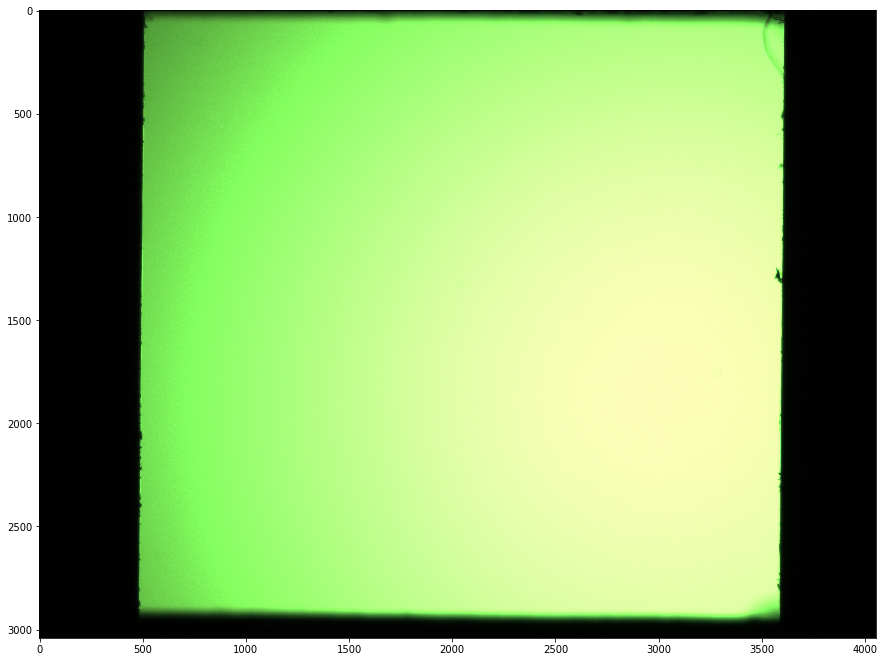

In [26]:
raw = rawpy.imread("/Volumes/PortableSSD/kreta_cleaned/frame-03630-flatfield-01.dng")
flatfield = raw.postprocess(
    output_color=rawpy.ColorSpace.raw,
    gamma=(1, 1),
    user_wb=[1.0, 1.0, 1.0, 1.0],
    no_auto_bright=True,
    output_bps=16,
    highlight_mode=rawpy.HighlightMode.Reconstruct(9)
)

plt.figure(figsize=(15,12))
plt.imshow(flatfield/2**16, interpolation="none")
plt.show()

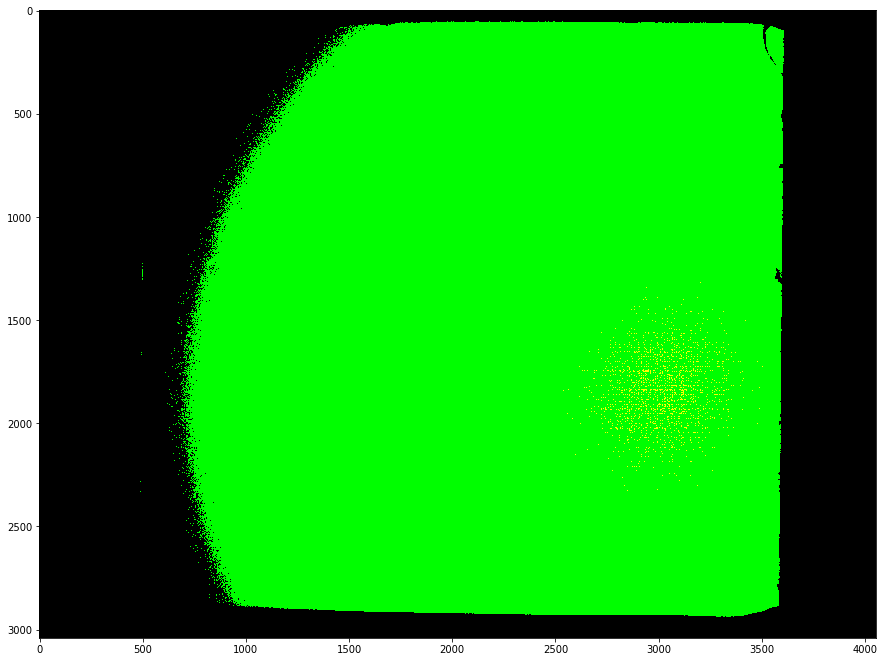

In [27]:
clipping = flatfield.copy()
clipping[clipping < 2**16-1] = 0

plt.figure(figsize=(15,12))
plt.imshow(clipping/2**16, interpolation="none")
plt.show()

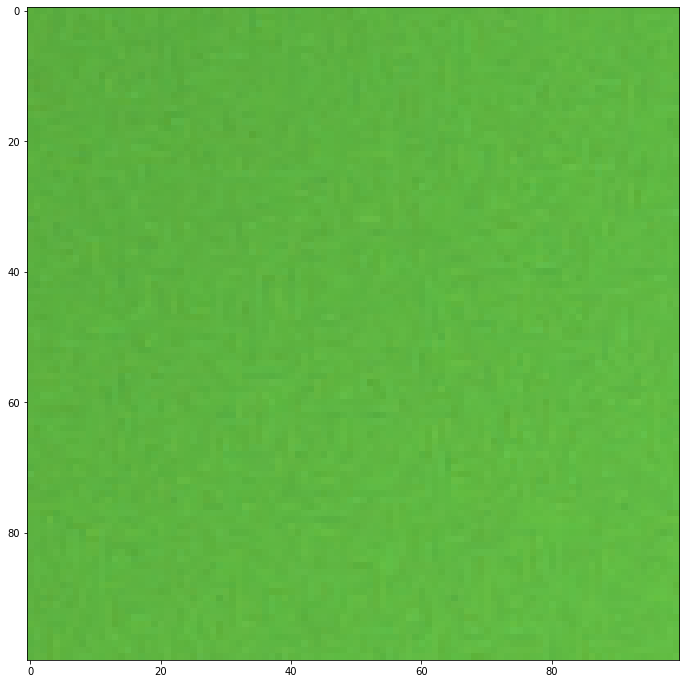

In [28]:
cropped = flatfield[200:300,600:700]

plt.figure(figsize=(15,12))
plt.imshow(cropped/(2**16), interpolation="none")
plt.show()

In [29]:
avg_r = np.average(cropped[..., 0])
avg_g = np.average(cropped[..., 1])
avg_b = np.average(cropped[..., 2])
print(avg_r, avg_g, avg_b)

24225.4431 46630.0644 16891.6607


In [30]:
base_wb = [avg_g/avg_r, 1.0, avg_g/avg_b, 1.0]
print(base_wb)

[1.924838452180881, 1.0, 2.7605375947434228, 1.0]


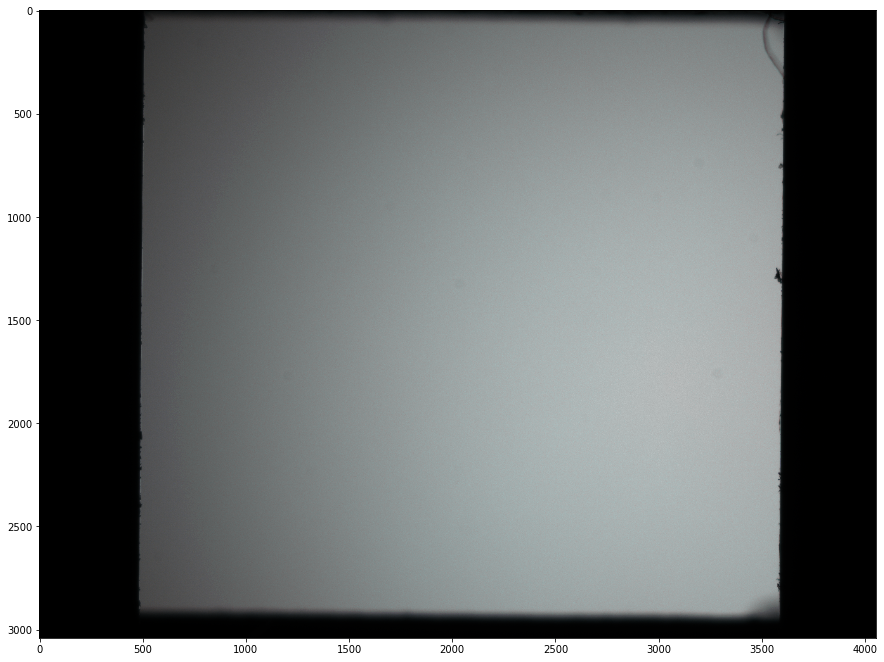

In [31]:
whitebalanced = raw.postprocess(
    output_color=rawpy.ColorSpace.raw,
    gamma=(1, 1),
    user_wb=base_wb,
    no_auto_bright=True,
    output_bps=16,
    highlight_mode=rawpy.HighlightMode.Reconstruct(9)
)

plt.figure(figsize=(15,12))
plt.imshow(whitebalanced/(2**16), interpolation="none")
plt.show()

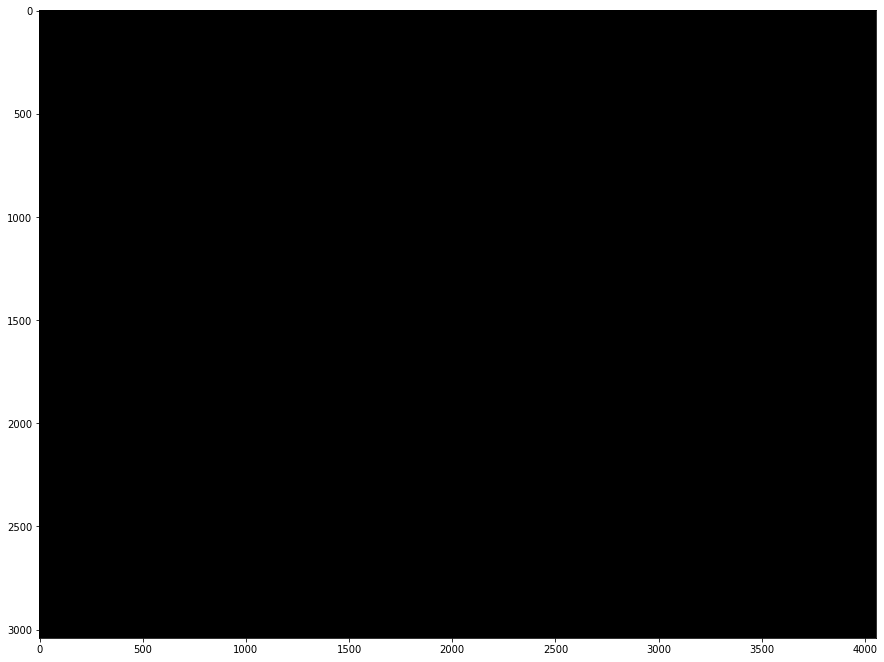

In [32]:
clipping = whitebalanced.copy()
clipping[clipping < 2**16-1] = 0

plt.figure(figsize=(15,12))
plt.imshow(clipping/2**16, interpolation="none")
plt.show()

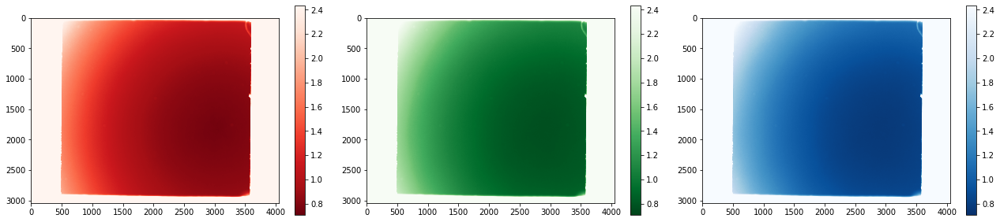

In [35]:
roi = whitebalanced[200:2750,600:3400]
gain = roi.mean(axis=(0,1)) / whitebalanced.astype("float").clip(1e-6, None)

plt.figure(figsize=(18,4))
plt.subplot(131)
plt.imshow(gain[:,:,0], cmap="Reds_r", vmin=gain[200:2750,600:3400].min(), vmax=gain[200:2750,600:3400].max())
plt.colorbar()
plt.subplot(132)
plt.imshow(gain[:,:,1], cmap="Greens_r", vmin=gain[200:2750,600:3400].min(), vmax=gain[200:2750,600:3400].max())
plt.colorbar()
plt.subplot(133)
plt.imshow(gain[:,:,2], cmap="Blues_r", vmin=gain[200:2750,600:3400].min(), vmax=gain[200:2750,600:3400].max())
plt.colorbar()
plt.tight_layout()
plt.show()

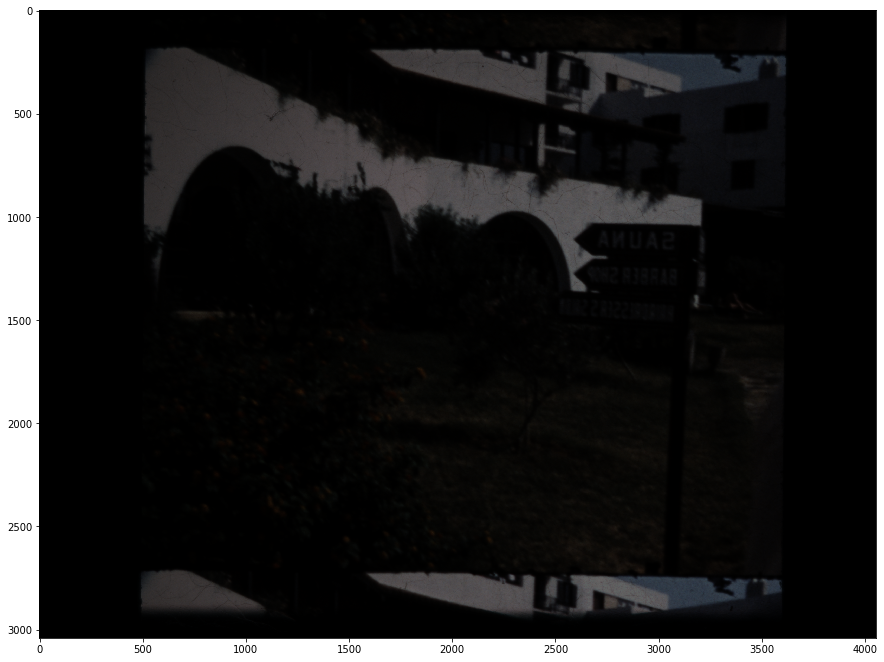

In [36]:
raw = rawpy.imread("/Volumes/PortableSSD/kreta_cleaned/frame-00792.dng")
rgb = raw.postprocess(
    output_color=rawpy.ColorSpace.raw,
    gamma=(1, 1),
    user_wb=base_wb,
    no_auto_bright=True,
    output_bps=16,
    highlight_mode=rawpy.HighlightMode.Reconstruct(9)
)

plt.figure(figsize=(15,12))
plt.imshow(rgb/(2**16), interpolation="none")
plt.show()

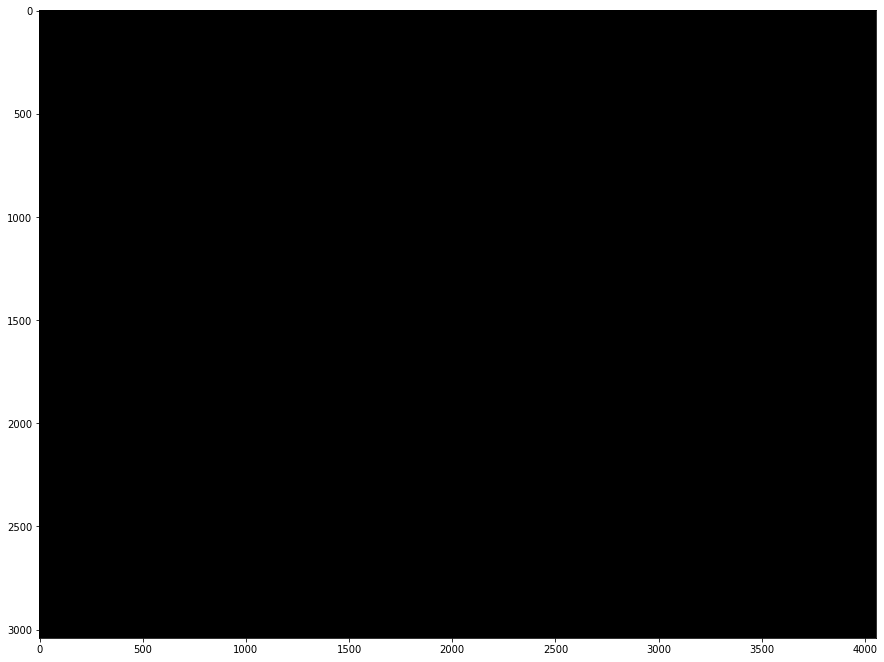

In [37]:
clipping = rgb.copy()
clipping[clipping < 2**16-1] = 0

plt.figure(figsize=(15,12))
plt.imshow(clipping/2**16, interpolation="none")
plt.show()

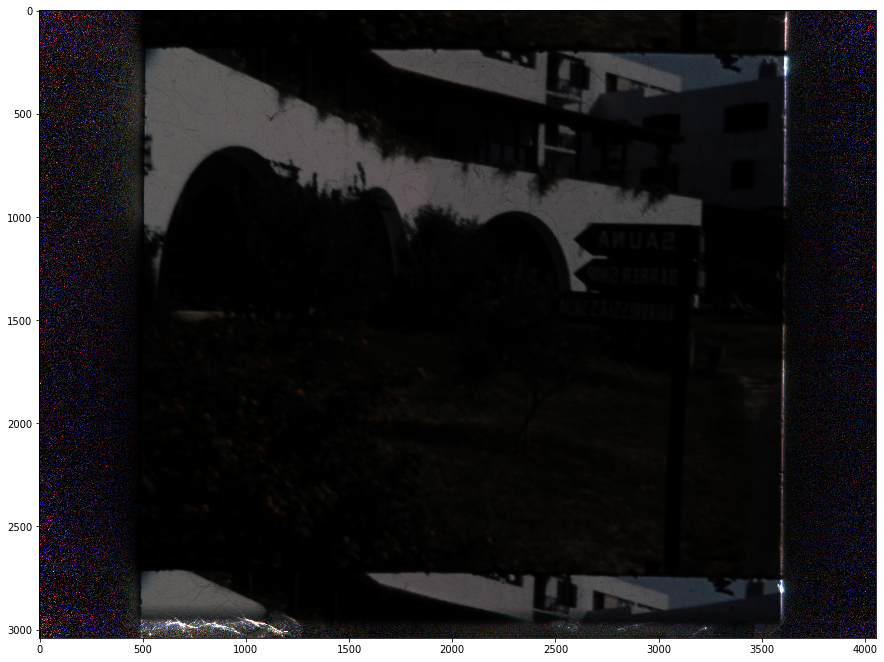

In [38]:
corrected = (rgb * gain).clip(0, 2**16-1).astype("uint16")

plt.figure(figsize=(15,12))
plt.imshow(corrected/(2**16), interpolation="none")
plt.show()

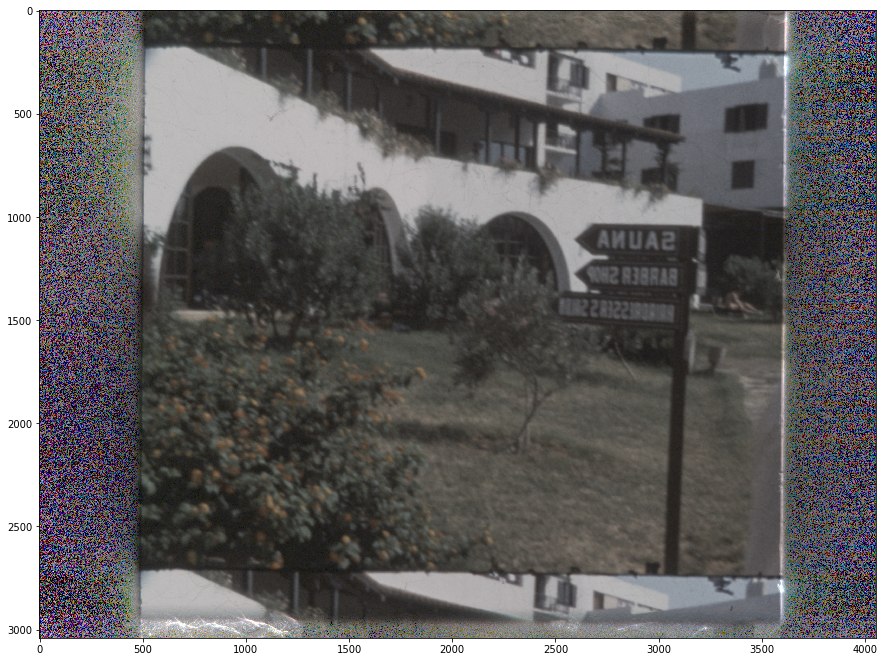

In [39]:
normalized = corrected / (2**16 - 1)

plt.figure(figsize=(15,12))
plt.imshow(normalized**0.3, interpolation="none")
plt.show()

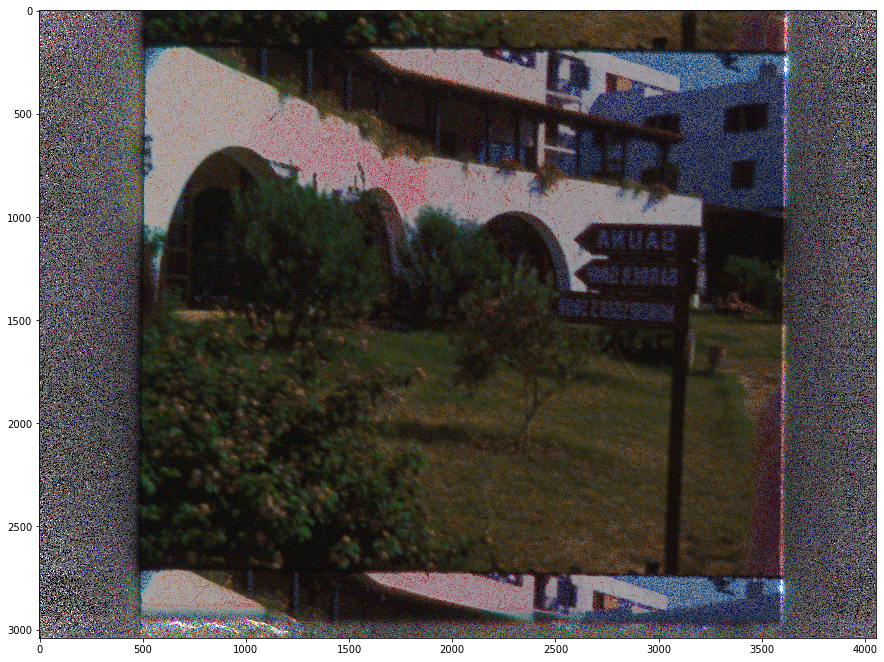

In [40]:
hsv = cv2.cvtColor((normalized**0.4 * 255).clip(0, 255).astype("uint8"), cv2.COLOR_RGB2HSV)
hsv[:,:,1] = (hsv[:,:,1]**2).clip(0, 255).astype("uint8")
saturated = cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)

plt.figure(figsize=(15,12))
plt.imshow(saturated, interpolation="none")
plt.show()

In [144]:
tiff.imsave("ffrawpytest.tiff", corrected)